In [1]:
using Plots
plotlyjs()
using LinearAlgebra
using Printf
using Random
Random.seed!(42)

WebIO._IJuliaInit()

TaskLocalRNG()

ЛАБОРАТОРНАЯ РАБОТА 6.1: МНОГОПАРАМЕТРИЧЕСКИЕ МЕТОДЫ — n-МЕРНЫЙ СЛУЧАЙ
Милем-Контрелл (2 пар.) vs Кректа-Леви (до n+1 пар.)
n ∈ {2, 3, 5, 10, 100}

██████████████████████████████████████████████████████████████████████████████████████████████████████████████
  КВАДРАТИЧНАЯ ФУНКЦИЯ (κ = 10)
██████████████████████████████████████████████████████████████████████████████████████████████████████████████

  n = 2
    Милем-Контрелл:      2 итер., f* =    2.4483e-15, |∇f| = 1.67e-07 ✓
    Кректа-Леви:         2 итер., f* =    2.3167e-15, |∇f| = 2.22e-07 ✓

  n = 3
    Милем-Контрелл:      4 итер., f* =    1.8292e-14, |∇f| = 6.60e-07 ✓
    Кректа-Леви:         3 итер., f* =    1.1853e-15, |∇f| = 1.62e-07 ✓

  n = 5
    Милем-Контрелл:      5 итер., f* =    2.4924e-14, |∇f| = 7.75e-07 ✓
    Кректа-Леви:         5 итер., f* =    4.9838e-15, |∇f| = 2.87e-07 ✓

  n = 10
    Милем-Контрелл:     10 итер., f* =    1.8299e-14, |∇f| = 8.34e-07 ✓
    Кректа-Леви:        10 итер., f* =    1.0924e-14, |∇f

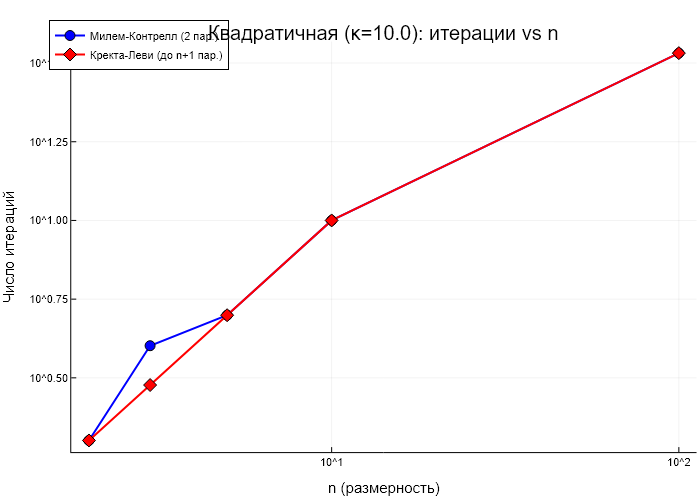

Сохранено: lab6_1/iters_vs_n_Квадратичная__κ_10_0_.html


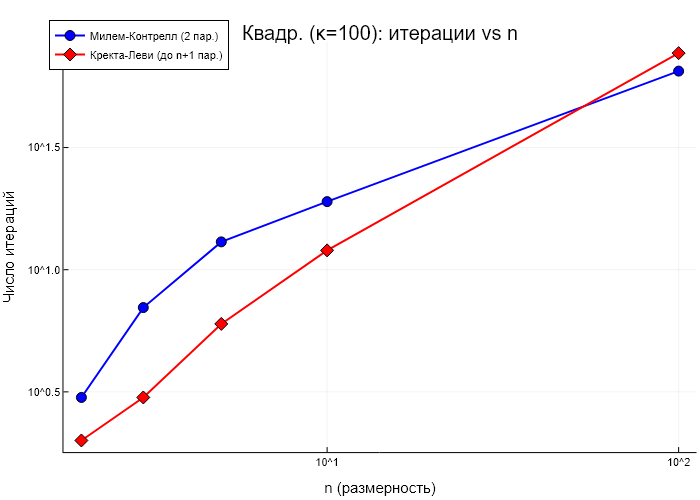

Сохранено: lab6_1/iters_vs_n_Квадр___κ_100_.html


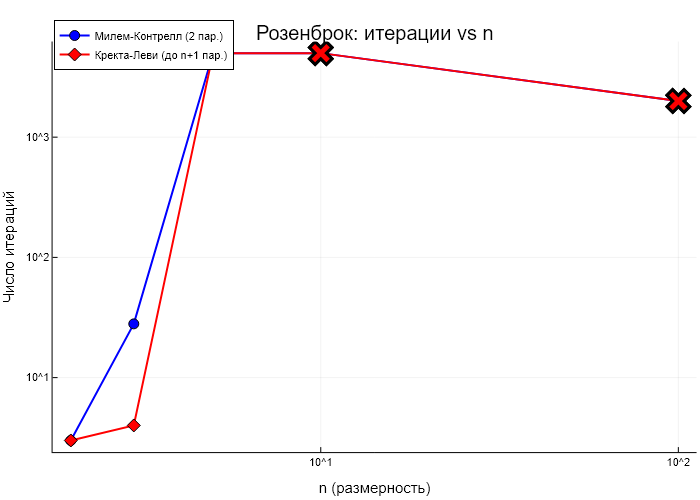

Сохранено: lab6_1/iters_vs_n_Розенброк.html


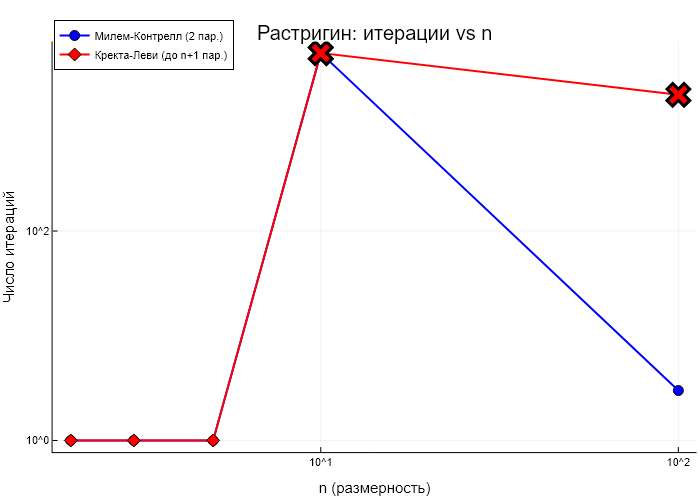

Сохранено: lab6_1/iters_vs_n_Растригин.html


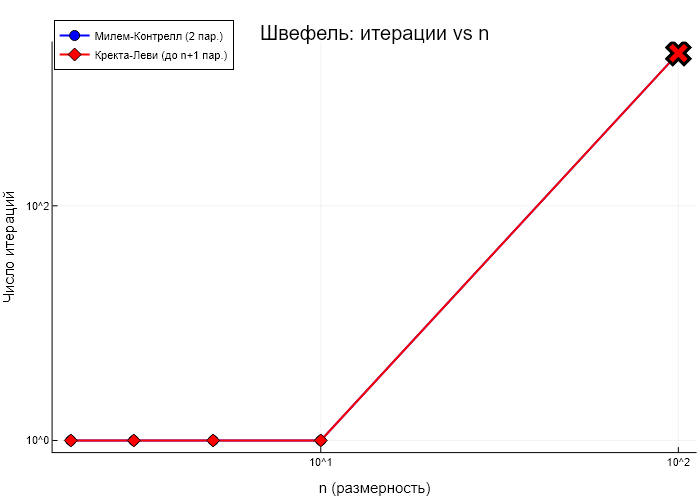

Сохранено: lab6_1/iters_vs_n_Швефель.html


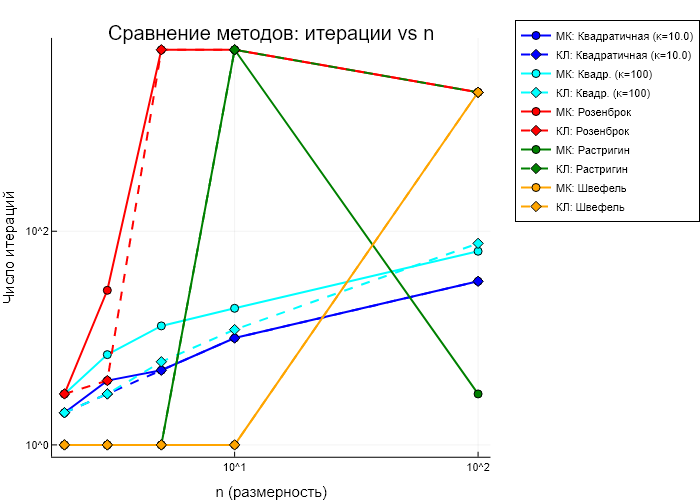

Сохранено: lab6_1/all_iters_vs_n.html

--- Проекционные графики ---


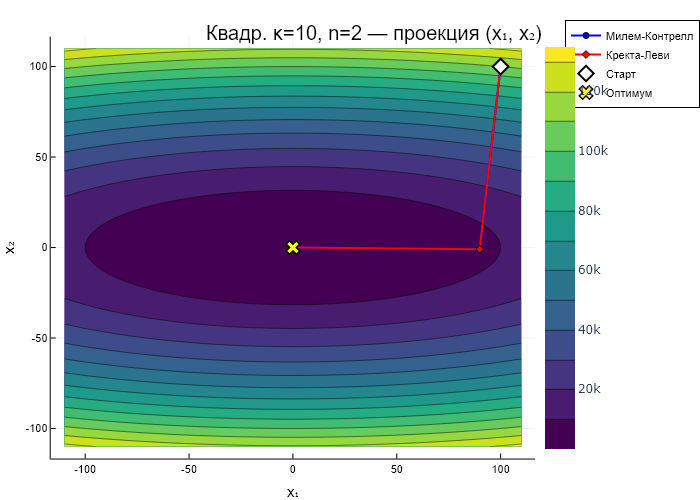

Сохранено: lab6_1/projection_quad_n2.html


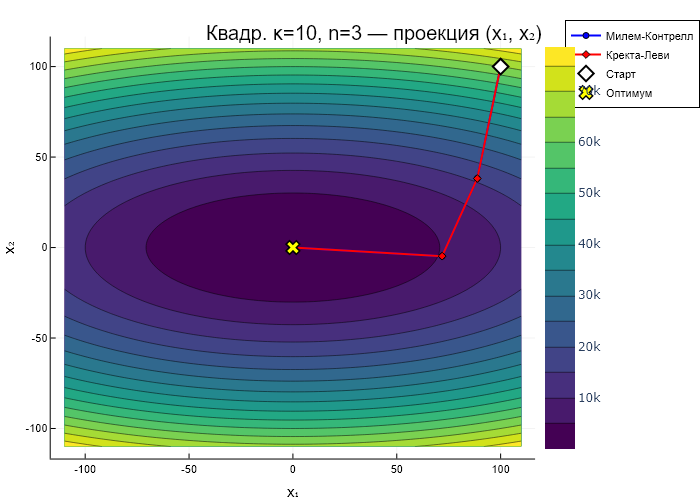

Сохранено: lab6_1/projection_quad_n3.html


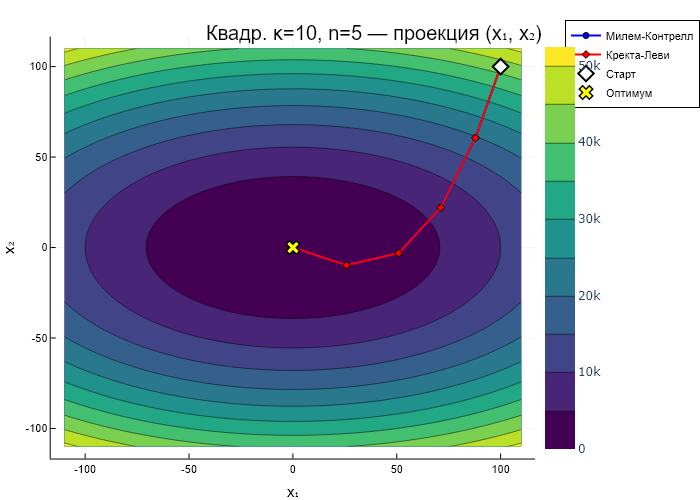

Сохранено: lab6_1/projection_quad_n5.html

--- Графики сходимости ---


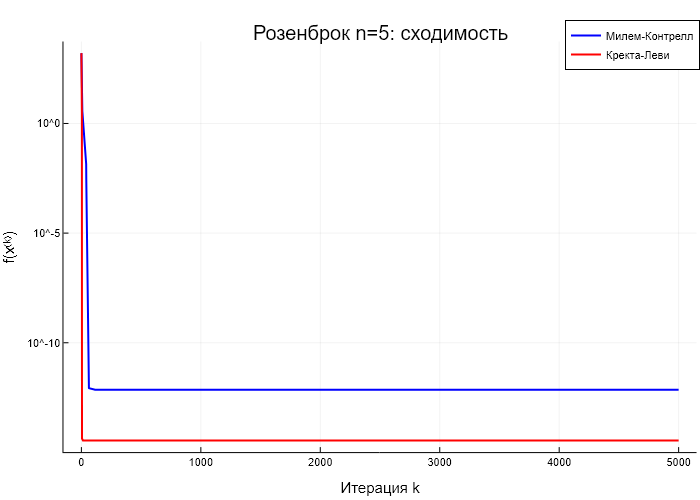

Сохранено: lab6_1/convergence_Розенброк_n_5.html


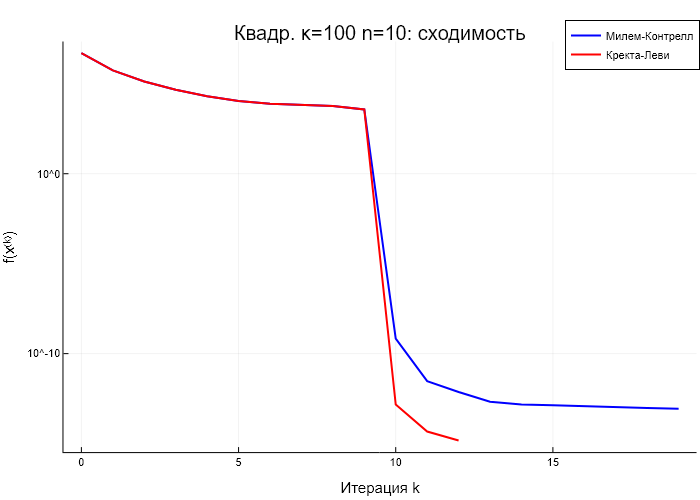

Сохранено: lab6_1/convergence_Квадр__κ_100_n_10.html

Графики сохранены в lab6_1/
Готово!


In [4]:

# ============================================================================
# Нелдер-Мид (с защитой от Inf/NaN)
# ============================================================================

function nelder_mead(f_raw, x0; tol=1e-14, maxiter=3000, initial_step=1.0,
        alpha=1.0, gamma=2.0, rho=0.5, sigma=0.5)
    # Обёртка: если f возвращает Inf/NaN, заменяем на большое число
    f(x) = begin
        v = f_raw(x)
        isfinite(v) ? v : 1e100
    end
    n = length(x0)
    simplex = Vector{Vector{Float64}}(undef, n + 1)
    simplex[1] = copy(x0)
    for i in 1:n
        v = copy(x0)
        v[i] += initial_step
        simplex[i + 1] = v
    end
    fvals = [f(simplex[i]) for i in 1:n+1]

    for _ in 1:maxiter
        order = sortperm(fvals)
        simplex = simplex[order]
        fvals = fvals[order]
        spread = maximum(abs(fvals[i] - fvals[1]) for i in 2:n+1)
        spread < tol && break
        diam = maximum(norm(simplex[i] - simplex[1]) for i in 2:n+1)
        diam < 1e-16 && break
        x_bar = sum(simplex[i] for i in 1:n) / n
        x_r = x_bar + alpha * (x_bar - simplex[n+1])
        f_r = f(x_r)
        if fvals[1] <= f_r < fvals[n]
            simplex[n+1] = x_r; fvals[n+1] = f_r
            continue
        end
        if f_r < fvals[1]
            x_e = x_bar + gamma * (x_r - x_bar)
            f_e = f(x_e)
            if f_e < f_r
                simplex[n+1] = x_e; fvals[n+1] = f_e
            else
                simplex[n+1] = x_r; fvals[n+1] = f_r
            end
            continue
        end
        x_c = x_bar + rho * (simplex[n+1] - x_bar)
        f_c = f(x_c)
        if f_c < fvals[n+1]
            simplex[n+1] = x_c; fvals[n+1] = f_c
            continue
        end
        for i in 2:n+1
            simplex[i] = simplex[1] + sigma * (simplex[i] - simplex[1])
            fvals[i] = f(simplex[i])
        end
    end
    order = sortperm(fvals)
    return simplex[order[1]]
end

function nelder_mead_multistart(f, x0; tol=1e-14, maxiter=3000, scales=[0.1, 1.0, 10.0])
    best_x = copy(x0)
    best_f = f(x0)
    if !isfinite(best_f)
        best_f = 1e100
    end
    for s in scales
        x_opt = nelder_mead(f, x0; tol=tol, maxiter=maxiter, initial_step=s)
        fv = f(x_opt)
        if isfinite(fv) && fv < best_f
            best_f = fv
            best_x = x_opt
        end
    end
    return best_x
end

# ============================================================================
# Метод Милема и Контрелла (всегда 2 параметра: λ₀, λ₁)
# С ограничением шага: ||x_new - x|| ≤ max_step_norm
# ============================================================================

function milem_kontrell(f, grad_f, x0; eps=1e-6, maxiter=5000, max_step_norm=1e6)
    n = length(x0)
    x = copy(x0)
    traj_f = [f(x)]
    delta_x_prev = zeros(n)
    iters = 0

    for k in 1:maxiter
        g = grad_f(x)
        ng = norm(g)
        ng <= eps && break
        if mod(k - 1, n + 1) == 0 && k > 1
            delta_x_prev = zeros(n)
        end
        grad_k = copy(g)
        dx_prev = copy(delta_x_prev)
        x_cur = copy(x)
        fx_cur = f(x_cur)
        # Ограничиваем λ, чтобы шаг не улетал
        lam_bound = max_step_norm / (ng + 1e-30)
        g_func(lam) = begin
            l0 = clamp(lam[1], -lam_bound, lam_bound)
            l1 = clamp(lam[2], -lam_bound, lam_bound)
            y = x_cur - l0 * grad_k + l1 * dx_prev
            v = f(y)
            isfinite(v) ? v : 1e100
        end
        ng2 = dot(grad_k, grad_k)
        lam0_est = min(fx_cur / (ng2 + 1e-30), lam_bound)
        s1 = max(abs(lam0_est) * 0.1, 1e-8)
        s2 = max(abs(lam0_est), 1e-6)
        s3 = min(abs(lam0_est) * 10.0, lam_bound * 0.1)
        lam_opt = nelder_mead_multistart(g_func, [lam0_est, 0.0];
            tol=1e-14, maxiter=1000, scales=[s1, s2, s3])
        l0 = clamp(lam_opt[1], -lam_bound, lam_bound)
        l1 = clamp(lam_opt[2], -lam_bound, lam_bound)
        x_new = x_cur - l0 * grad_k + l1 * dx_prev
        # Проверка: не ухудшили ли
        fn = f(x_new)
        if !isfinite(fn) || fn > fx_cur * 1e10
            # Откат: простой градиентный шаг с малым α
            alpha = 1.0 / (ng + 1e-30)
            for _ in 1:30
                x_try = x_cur - alpha * grad_k
                ft = f(x_try)
                if isfinite(ft) && ft < fx_cur
                    x_new = x_try
                    break
                end
                alpha /= 2
            end
        end
        delta_x_prev = x_new - x
        x = x_new
        iters = k
        push!(traj_f, f(x))
    end
    return x, f(x), iters, traj_f
end

# ============================================================================
# Метод Кректа и Леви (до n+1 параметров)
# ============================================================================

function krekta_levi(f, grad_f, x0; eps=1e-6, maxiter=5000, max_step_norm=1e6)
    n = length(x0)
    x = copy(x0)
    traj_f = [f(x)]
    history = Vector{Vector{Float64}}()
    iters = 0

    for k in 1:maxiter
        g = grad_f(x)
        ng = norm(g)
        ng <= eps && break
        if mod(k - 1, n + 1) == 0 && k > 1
            empty!(history)
        end
        grad_k = copy(g)
        x_cur = copy(x)
        fx_cur = f(x_cur)
        hist_k = [copy(h) for h in history]
        m = length(hist_k)
        lam_bound = max_step_norm / (ng + 1e-30)
        function g_func(lam)
            y = x_cur - clamp(lam[1], -lam_bound, lam_bound) * grad_k
            for i in 1:m
                y = y + clamp(lam[i + 1], -lam_bound, lam_bound) * hist_k[i]
            end
            v = f(y)
            isfinite(v) ? v : 1e100
        end
        ng2 = dot(grad_k, grad_k)
        lam0_est = min(fx_cur / (ng2 + 1e-30), lam_bound)
        lam_start = zeros(m + 1)
        lam_start[1] = lam0_est
        s1 = max(abs(lam0_est) * 0.1, 1e-8)
        s2 = max(abs(lam0_est), 1e-6)
        s3 = min(abs(lam0_est) * 10.0, lam_bound * 0.1)
        lam_opt = nelder_mead_multistart(g_func, lam_start;
            tol=1e-14, maxiter=1000, scales=[s1, s2, s3])
        x_new = x_cur - clamp(lam_opt[1], -lam_bound, lam_bound) * grad_k
        for i in 1:m
            x_new = x_new + clamp(lam_opt[i + 1], -lam_bound, lam_bound) * hist_k[i]
        end
        fn = f(x_new)
        if !isfinite(fn) || fn > fx_cur * 1e10
            alpha = 1.0 / (ng + 1e-30)
            for _ in 1:30
                x_try = x_cur - alpha * grad_k
                ft = f(x_try)
                if isfinite(ft) && ft < fx_cur
                    x_new = x_try
                    break
                end
                alpha /= 2
            end
        end
        dx = x_new - x
        push!(history, copy(dx))
        if length(history) > n
            popfirst!(history)
        end
        x = x_new
        iters = k
        push!(traj_f, f(x))
    end
    return x, f(x), iters, traj_f
end

# ============================================================================
# n-мерные тестовые функции
# ============================================================================

function make_quadratic_nd(n; kappa=10.0)
    alphas = range(1.0, kappa, length=n) |> collect
    f(x) = sum(alphas[i] * x[i]^2 for i in 1:n)
    grad_f(x) = [2 * alphas[i] * x[i] for i in 1:n]
    return f, grad_f, "Квадратичная (κ=$kappa)"
end

function make_rosenbrock_nd(n)
    f(x) = sum(100*(x[i+1] - x[i]^2)^2 + (1 - x[i])^2 for i in 1:n-1)
    function grad_f(x)
        g = zeros(n)
        for i in 1:n-1
            g[i] += -400*x[i]*(x[i+1] - x[i]^2) - 2*(1 - x[i])
            g[i+1] += 200*(x[i+1] - x[i]^2)
        end
        return g
    end
    return f, grad_f, "Розенброк"
end

function make_rastrigin_nd(n)
    f(x) = 10*n + sum(x[i]^2 - 10*cos(2π*x[i]) for i in 1:n)
    grad_f(x) = [2*x[i] + 20π*sin(2π*x[i]) for i in 1:n]
    return f, grad_f, "Растригин"
end

function make_schwefel_nd(n)
    f(x) = 418.9829*n - sum(x[i]*sin(sqrt(abs(x[i]))) for i in 1:n)
    function grad_f(x)
        g = zeros(n)
        for i in 1:n
            ai = abs(x[i])
            if ai < 1e-12
                g[i] = 0.0
            else
                sqai = sqrt(ai)
                g[i] = -(sin(sqai) + (sqai / 2) * cos(sqai))
            end
        end
        return g
    end
    return f, grad_f, "Швефель"
end

# ============================================================================
# Запуск
# ============================================================================

dims = [2, 3, 5, 10, 100]
mkpath("lab6_1")

println("=" ^ 110)
println("ЛАБОРАТОРНАЯ РАБОТА 6.1: МНОГОПАРАМЕТРИЧЕСКИЕ МЕТОДЫ — n-МЕРНЫЙ СЛУЧАЙ")
println("Милем-Контрелл (2 пар.) vs Кректа-Леви (до n+1 пар.)")
println("n ∈ {2, 3, 5, 10, 100}")
println("=" ^ 110)

struct BenchResult
    func_name::String
    n::Int
    method::String
    iters::Int
    fval::Float64
    gnorm::Float64
    converged::Bool
end

all_bench = BenchResult[]

function get_maxiter(n)
    n <= 10 ? 5000 : 2000
end

# Ограничение шага: для Швефеля область [-500, 500], шаг не должен улетать
function get_max_step(fname, n)
    return 1000.0 * sqrt(n)
end

function run_bench(f, grad_f, x0, fname, n)
    mi = get_maxiter(n)
    ms = get_max_step(fname, n)
    println("\n  n = $n")

    xf_mk, fv_mk, ni_mk, tf_mk = milem_kontrell(f, grad_f, x0;
        eps=1e-6, maxiter=mi, max_step_norm=ms)
    gn_mk = norm(grad_f(xf_mk))

    xf_kl, fv_kl, ni_kl, tf_kl = krekta_levi(f, grad_f, x0;
        eps=1e-6, maxiter=mi, max_step_norm=ms)
    gn_kl = norm(grad_f(xf_kl))

    push!(all_bench, BenchResult(fname, n, "Милем-Контрелл", ni_mk, fv_mk, gn_mk, gn_mk <= 1e-6))
    push!(all_bench, BenchResult(fname, n, "Кректа-Леви", ni_kl, fv_kl, gn_kl, gn_kl <= 1e-6))

    @printf("    Милем-Контрелл:  %5d итер., f* = %13.4e, |∇f| = %.2e %s\n",
        ni_mk, fv_mk, gn_mk, gn_mk <= 1e-6 ? "✓" : "✗")
    @printf("    Кректа-Леви:     %5d итер., f* = %13.4e, |∇f| = %.2e %s\n",
        ni_kl, fv_kl, gn_kl, gn_kl <= 1e-6 ? "✓" : "✗")

    return tf_mk, tf_kl
end

# --- 1. Квадратичная (κ=10) ---
println("\n" * "█" ^ 110)
println("  КВАДРАТИЧНАЯ ФУНКЦИЯ (κ = 10)")
println("█" ^ 110)
for n in dims
    f, grad_f, fname = make_quadratic_nd(n; kappa=10.0)
    x0 = fill(100.0, n)
    run_bench(f, grad_f, x0, fname, n)
end

# --- 2. Квадратичная (κ=100) ---
println("\n" * "█" ^ 110)
println("  КВАДРАТИЧНАЯ ФУНКЦИЯ (κ = 100)")
println("█" ^ 110)
for n in dims
    f, grad_f, fname = make_quadratic_nd(n; kappa=100.0)
    x0 = fill(100.0, n)
    run_bench(f, grad_f, x0, "Квадр. (κ=100)", n)
end

# --- 3. Розенброк ---
println("\n" * "█" ^ 110)
println("  РОЗЕНБРОК (обобщённый)")
println("█" ^ 110)
for n in dims
    f, grad_f, fname = make_rosenbrock_nd(n)
    x0 = fill(-1.0, n)
    run_bench(f, grad_f, x0, fname, n)
end

# --- 4. Растригин ---
# x0 = 3.7 (не на периоде cos, чтобы не попадать за 1 шаг в минимум)
println("\n" * "█" ^ 110)
println("  РАСТРИГИН")
println("█" ^ 110)
for n in dims
    f, grad_f, fname = make_rastrigin_nd(n)
    x0 = fill(3.7, n)
    run_bench(f, grad_f, x0, fname, n)
end

# --- 5. Швефель ---
println("\n" * "█" ^ 110)
println("  ШВЕФЕЛЬ")
println("█" ^ 110)
for n in dims
    f, grad_f, fname = make_schwefel_nd(n)
    x0 = fill(200.0, n)
    run_bench(f, grad_f, x0, fname, n)
end

# ============================================================================
# Сводная таблица
# ============================================================================

println("\n" * "=" ^ 110)
println("СВОДНАЯ ТАБЛИЦА: ЧИСЛО ИТЕРАЦИЙ В ЗАВИСИМОСТИ ОТ n")
println("=" ^ 110)
@printf("%-20s  %5s  %-18s  %6s  %13s  %10s  %s\n",
    "Функция", "n", "Метод", "Итер.", "f*", "|∇f|", "Сход.")
println("-" ^ 105)
for r in all_bench
    @printf("%-20s  %5d  %-18s  %6d  %13.4e  %10.2e  %s\n",
        r.func_name, r.n, r.method, r.iters, r.fval, r.gnorm,
        r.converged ? "✓" : "✗")
end
println("=" ^ 110)

# ============================================================================
# Графики: итерации vs n
# ============================================================================

func_names_unique = unique([r.func_name for r in all_bench])

all_colors = [:blue, :cyan, :red, :green, :orange, :purple, :brown]

for (idx, fname) in enumerate(func_names_unique)
    subset = filter(r -> r.func_name == fname, all_bench)
    mk_data = filter(r -> r.method == "Милем-Контрелл", subset)
    kl_data = filter(r -> r.method == "Кректа-Леви", subset)

    ns_mk = [r.n for r in mk_data]
    it_mk = [max(r.iters, 1) for r in mk_data]
    ns_kl = [r.n for r in kl_data]
    it_kl = [max(r.iters, 1) for r in kl_data]

    p = plot(ns_mk, it_mk,
        label="Милем-Контрелл (2 пар.)",
        color=:blue, linewidth=2, markershape=:circle, markersize=5,
        xlabel="n (размерность)", ylabel="Число итераций",
        title="$fname: итерации vs n",
        xscale=:log10, yscale=:log10,
        legend=:topleft, size=(800, 500))
    plot!(p, ns_kl, it_kl,
        label="Кректа-Леви (до n+1 пар.)",
        color=:red, linewidth=2, markershape=:diamond, markersize=5)
    for r in mk_data
        if !r.converged
            scatter!(p, [r.n], [max(r.iters, 1)], markershape=:x, markersize=10,
                markercolor=:blue, markerstrokewidth=3, label="")
        end
    end
    for r in kl_data
        if !r.converged
            scatter!(p, [r.n], [max(r.iters, 1)], markershape=:x, markersize=10,
                markercolor=:red, markerstrokewidth=3, label="")
        end
    end
    display(p)
    safe_fname = replace(fname, r"[^\w]" => "_")
    savefig(p, "lab6_1/iters_vs_n_$(safe_fname).html")
    println("Сохранено: lab6_1/iters_vs_n_$(safe_fname).html")
end

# Общий сводный график
p_all = plot(xlabel="n (размерность)", ylabel="Число итераций",
    title="Сравнение методов: итерации vs n",
    xscale=:log10, yscale=:log10,
    legend=:outertopright, size=(1200, 600))

for (idx, fname) in enumerate(func_names_unique)
    subset = filter(r -> r.func_name == fname, all_bench)
    mk_data = filter(r -> r.method == "Милем-Контрелл", subset)
    kl_data = filter(r -> r.method == "Кректа-Леви", subset)
    c = all_colors[mod(idx - 1, length(all_colors)) + 1]

    ns_mk = [r.n for r in mk_data]
    it_mk = [max(r.iters, 1) for r in mk_data]
    ns_kl = [r.n for r in kl_data]
    it_kl = [max(r.iters, 1) for r in kl_data]

    plot!(p_all, ns_mk, it_mk, label="МК: $fname",
        color=c, linewidth=2, markershape=:circle, markersize=4, linestyle=:solid)
    plot!(p_all, ns_kl, it_kl, label="КЛ: $fname",
        color=c, linewidth=2, markershape=:diamond, markersize=4, linestyle=:dash)
end
display(p_all)
savefig(p_all, "lab6_1/all_iters_vs_n.html")
println("Сохранено: lab6_1/all_iters_vs_n.html")

# ============================================================================
# Проекционные графики (x₁, x₂) для квадратичной κ=10, n ∈ {2, 3, 5}
# ============================================================================

println("\n--- Проекционные графики ---")

for n_proj in [2, 3, 5]
    f, grad_f, _ = make_quadratic_nd(n_proj; kappa=10.0)
    x0 = fill(100.0, n_proj)

    # Прогоняем с полными траекториями
    function run_full_traj(method_func, f, grad_f, x0)
        nn = length(x0)
        x = copy(x0)
        traj = [copy(x)]
        delta_x_prev = zeros(nn)
        history = Vector{Vector{Float64}}()
        ms = 1000.0 * sqrt(nn)

        for k in 1:5000
            g = grad_f(x)
            norm(g) <= 1e-6 && break
            grad_k = copy(g)
            x_cur = copy(x)
            fx_cur = f(x_cur)
            ng = norm(g)
            lam_bound = ms / (ng + 1e-30)
            ng2 = dot(grad_k, grad_k)
            lam0_est = min(fx_cur / (ng2 + 1e-30), lam_bound)
            s1 = max(abs(lam0_est) * 0.1, 1e-8)
            s2 = max(abs(lam0_est), 1e-6)
            s3 = min(abs(lam0_est) * 10.0, lam_bound * 0.1)

            if method_func == :mk
                if mod(k - 1, nn + 1) == 0 && k > 1
                    delta_x_prev = zeros(nn)
                end
                dx_prev = copy(delta_x_prev)
                g_func = let _xc = x_cur, _gk = grad_k, _dp = dx_prev, _lb = lam_bound, _f = f
                    lam -> begin
                        l0 = clamp(lam[1], -_lb, _lb)
                        l1 = clamp(lam[2], -_lb, _lb)
                        v = _f(_xc - l0 * _gk + l1 * _dp)
                        isfinite(v) ? v : 1e100
                    end
                end
                lam_opt = nelder_mead_multistart(g_func, [lam0_est, 0.0];
                    tol=1e-14, maxiter=1000, scales=[s1, s2, s3])
                x_new = x_cur - clamp(lam_opt[1], -lam_bound, lam_bound) * grad_k +
                        clamp(lam_opt[2], -lam_bound, lam_bound) * dx_prev
                delta_x_prev = x_new - x
            else # :kl
                if mod(k - 1, nn + 1) == 0 && k > 1
                    empty!(history)
                end
                hist_k_local = [copy(h) for h in history]
                m_local = length(hist_k_local)
                g_func = let _xc = x_cur, _gk = grad_k, _hk = hist_k_local, _m = m_local, _lb = lam_bound, _f = f
                    lam -> begin
                        y = _xc - clamp(lam[1], -_lb, _lb) * _gk
                        for i in 1:_m
                            y = y + clamp(lam[i + 1], -_lb, _lb) * _hk[i]
                        end
                        v = _f(y)
                        isfinite(v) ? v : 1e100
                    end
                end
                lam_start = zeros(m_local + 1)
                lam_start[1] = lam0_est
                lam_opt = nelder_mead_multistart(g_func, lam_start;
                    tol=1e-14, maxiter=1000, scales=[s1, s2, s3])
                x_new = x_cur - clamp(lam_opt[1], -lam_bound, lam_bound) * grad_k
                for i in 1:m_local
                    x_new = x_new + clamp(lam_opt[i + 1], -lam_bound, lam_bound) * hist_k_local[i]
                end
                dx = x_new - x
                push!(history, copy(dx))
                if length(history) > nn
                    popfirst!(history)
                end
            end
            x = x_new
            push!(traj, copy(x))
        end
        return traj
    end

    traj_mk = run_full_traj(:mk, f, grad_f, x0)
    traj_kl = run_full_traj(:kl, f, grad_f, x0)

    # Проекция на (x₁, x₂)
    f2d(xx) = begin
        v = zeros(n_proj); v[1] = xx[1]; v[2] = xx[2]
        f(v)
    end
    xs = range(-110, 110, length=100)
    ys = range(-110, 110, length=100)
    zs = [f2d([xi, yi]) for yi in ys, xi in xs]

    p = contour(xs, ys, zs, levels=20, fill=true, color=:viridis,
        xlabel="x₁", ylabel="x₂",
        title="Квадр. κ=10, n=$n_proj — проекция (x₁, x₂)",
        colorbar=true, linewidth=0.3, size=(800, 650))
    tx_mk = [t[1] for t in traj_mk]
    ty_mk = [t[2] for t in traj_mk]
    tx_kl = [t[1] for t in traj_kl]
    ty_kl = [t[2] for t in traj_kl]
    plot!(p, tx_mk, ty_mk, color=:blue, linewidth=2, label="Милем-Контрелл",
        markershape=:circle, markersize=3, markercolor=:blue)
    plot!(p, tx_kl, ty_kl, color=:red, linewidth=2, label="Кректа-Леви",
        markershape=:diamond, markersize=3, markercolor=:red)
    scatter!(p, [100.0], [100.0], markershape=:diamond, markersize=6,
        markercolor=:white, markerstrokecolor=:black, markerstrokewidth=2, label="Старт")
    scatter!(p, [0.0], [0.0], markershape=:xcross, markersize=6,
        markercolor=:yellow, markerstrokecolor=:black, markerstrokewidth=1.5, label="Оптимум")
    display(p)
    savefig(p, "lab6_1/projection_quad_n$(n_proj).html")
    println("Сохранено: lab6_1/projection_quad_n$(n_proj).html")
end

# ============================================================================
# Графики сходимости f(x^{(k)}) vs k
# ============================================================================

println("\n--- Графики сходимости ---")

for (fname_short, make_func, x0_func) in [
    ("Розенброк n=5", () -> make_rosenbrock_nd(5), () -> fill(-1.0, 5)),
    ("Квадр. κ=100 n=10", () -> make_quadratic_nd(10; kappa=100.0), () -> fill(100.0, 10)),
]
    f, grad_f, _ = make_func()
    x0 = x0_func()
    ms = 1000.0 * sqrt(length(x0))
    _, _, _, tf_mk = milem_kontrell(f, grad_f, x0; eps=1e-6, maxiter=5000, max_step_norm=ms)
    _, _, _, tf_kl = krekta_levi(f, grad_f, x0; eps=1e-6, maxiter=5000, max_step_norm=ms)

    p = plot(0:length(tf_mk)-1, max.(tf_mk, 1e-18),
        label="Милем-Контрелл", color=:blue, linewidth=2,
        xlabel="Итерация k", ylabel="f(x⁽ᵏ⁾)",
        title="$fname_short: сходимость",
        yscale=:log10, legend=:topright, size=(800, 500))
    plot!(p, 0:length(tf_kl)-1, max.(tf_kl, 1e-18),
        label="Кректа-Леви", color=:red, linewidth=2)
    display(p)
    safe = replace(fname_short, r"[^\w]" => "_")
    savefig(p, "lab6_1/convergence_$(safe).html")
    println("Сохранено: lab6_1/convergence_$(safe).html")
end

println("\nГрафики сохранены в lab6_1/")
println("Готово!")

WebIO._IJuliaInit()

ЛАБОРАТОРНАЯ РАБОТА 6.2: x ∈ R² (фикс.), варьируем число λ
m — глубина памяти (макс. число предыдущих направлений)
Число параметров в подзадаче g: m+1
m=0 → наискорейший спуск, m=1 → Милем-Контрелл, m≥2 → Кректа-Леви

████████████████████████████████████████████████████████████████████████████████████████████████████
  Квадр. κ=10,  x₀ = (100.0, 100.0)
████████████████████████████████████████████████████████████████████████████████████████████████████

      m    dim(λ)   Итер.             f*        |∇f|  
  -----------------------------------------------------------------
      2         3       2     1.7606e-15    2.15e-07  ✓  КЛ (m=2)
      3         4       2     1.7606e-15    2.15e-07  ✓  КЛ (m=3)
      5         6       2     1.7606e-15    2.15e-07  ✓  КЛ (m=5)
     10        11       2     1.7606e-15    2.15e-07  ✓  КЛ (m=10)
    100       101       2     1.7606e-15    2.15e-07  ✓  КЛ (m=100)

██████████████████████████████████████████████████████████████████████████████████████

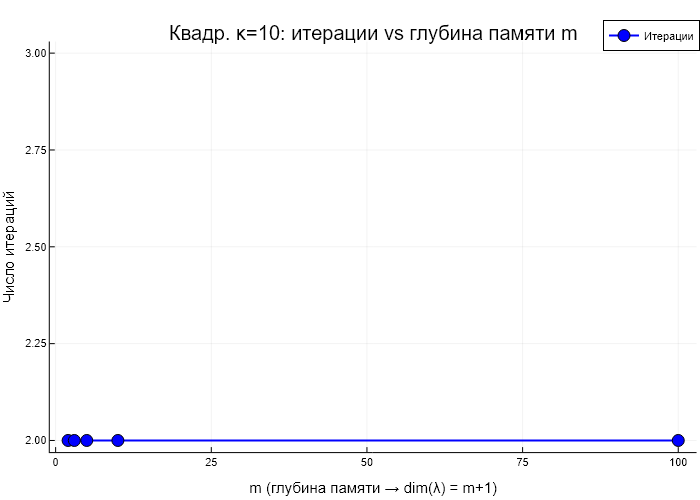

Сохранено: lab6_2/iters_vs_m_Квадр__κ_10.html


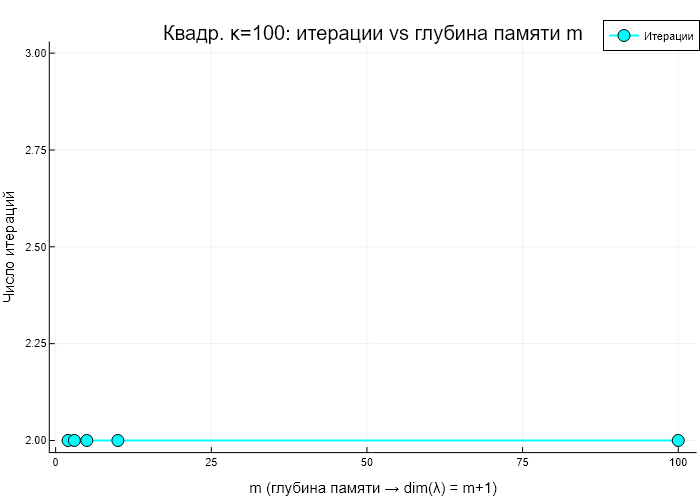

Сохранено: lab6_2/iters_vs_m_Квадр__κ_100.html


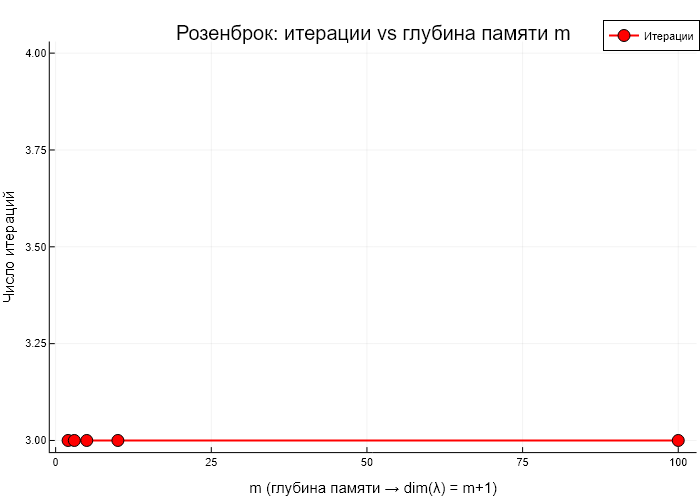

Сохранено: lab6_2/iters_vs_m_Розенброк.html


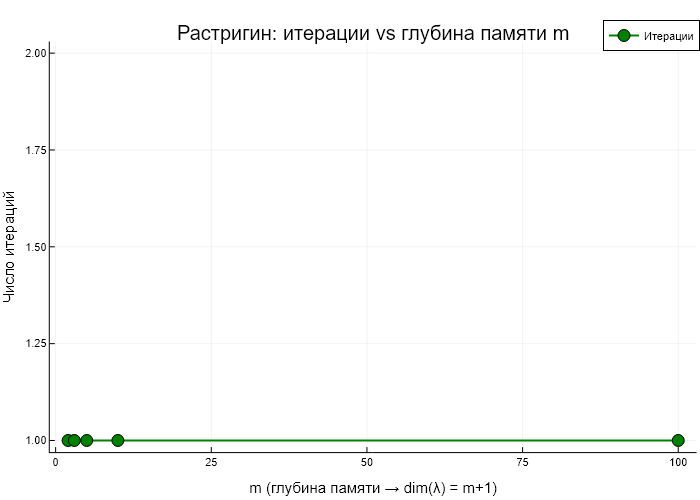

Сохранено: lab6_2/iters_vs_m_Растригин.html


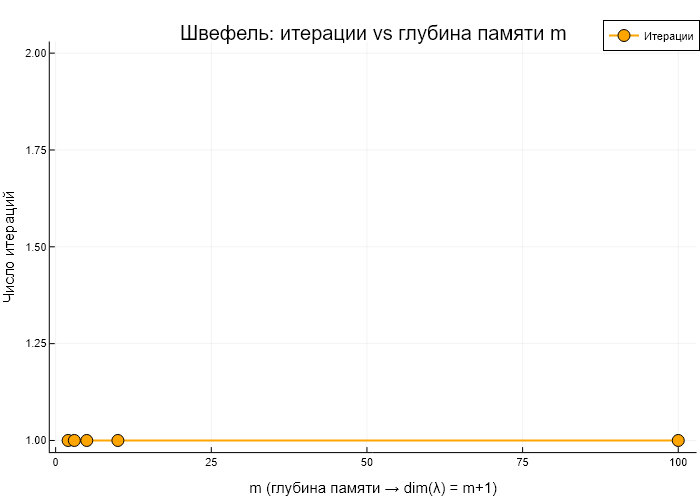

Сохранено: lab6_2/iters_vs_m_Швефель.html


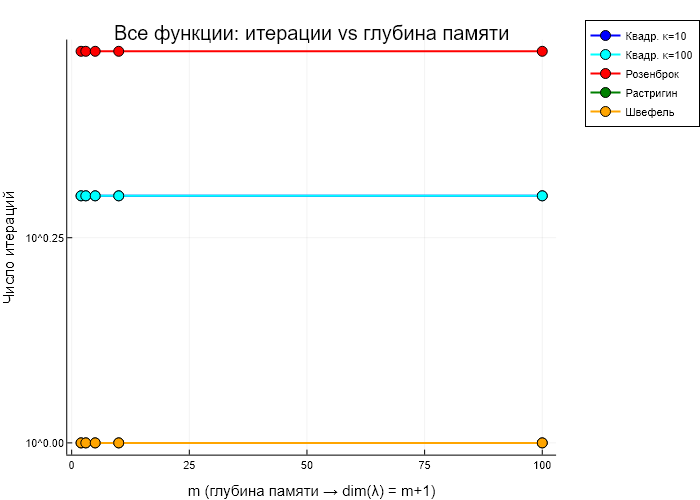

Сохранено: lab6_2/all_iters_vs_m.html

--- Графики сходимости ---


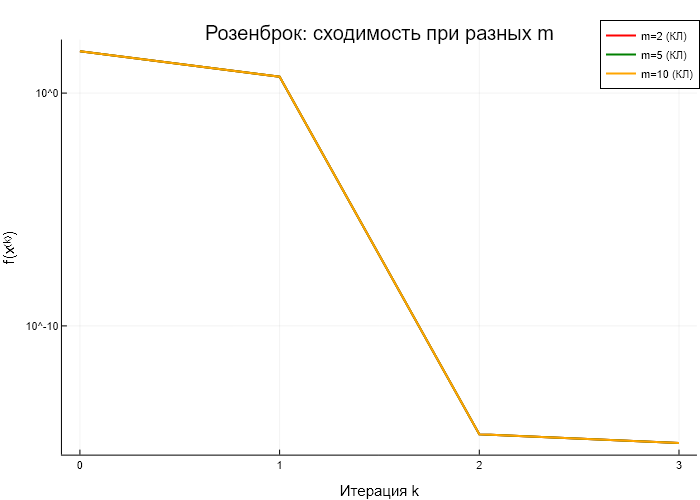

Сохранено: lab6_2/convergence_Розенброк.html


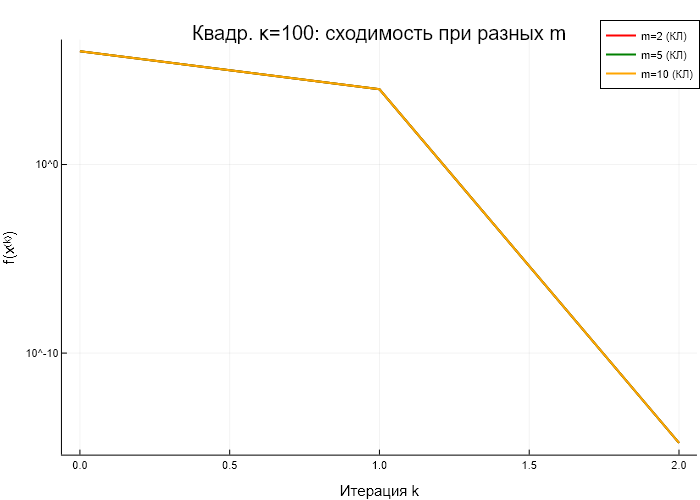

Сохранено: lab6_2/convergence_Квадр__κ_100.html

--- Траектории на контурной карте ---


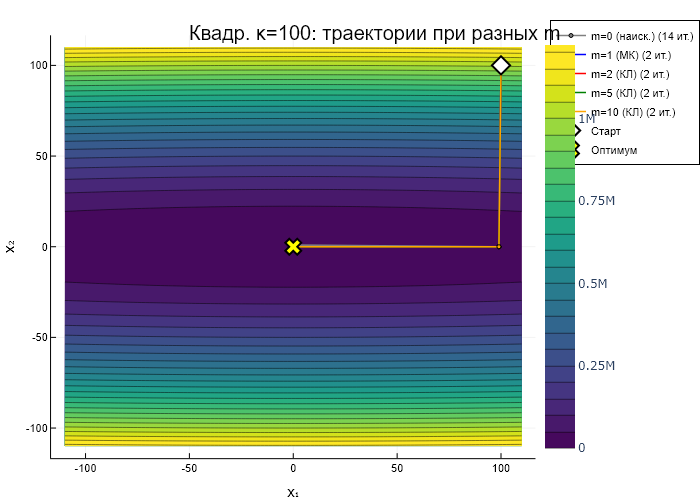

Сохранено: lab6_2/trajectories_Квадр__κ_100.html


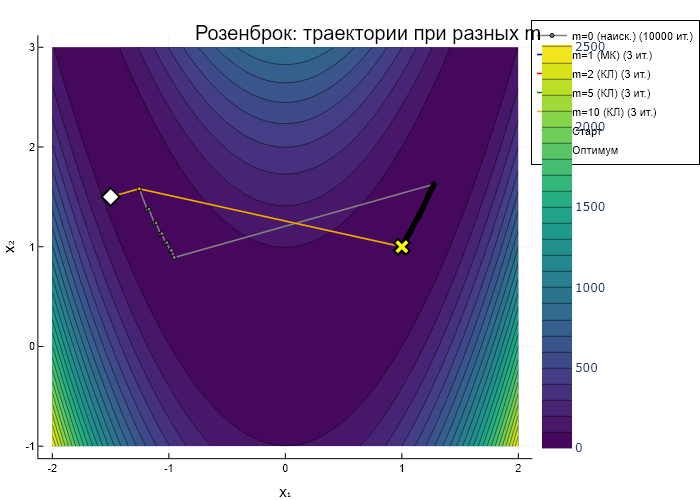

Сохранено: lab6_2/trajectories_Розенброк.html

Графики сохранены в lab6_2/
Готово!


In [1]:
using Plots
plotlyjs()
using LinearAlgebra
using Printf
using Random
Random.seed!(42)

# ============================================================================
# Нелдер-Мид
# ============================================================================

function nelder_mead(f_raw, x0; tol=1e-14, maxiter=3000, initial_step=1.0,
        alpha=1.0, gamma=2.0, rho=0.5, sigma=0.5)
    f(x) = begin
        v = f_raw(x)
        isfinite(v) ? v : 1e100
    end
    n = length(x0)
    simplex = Vector{Vector{Float64}}(undef, n + 1)
    simplex[1] = copy(x0)
    for i in 1:n
        v = copy(x0)
        v[i] += initial_step
        simplex[i + 1] = v
    end
    fvals = [f(simplex[i]) for i in 1:n+1]

    for _ in 1:maxiter
        order = sortperm(fvals)
        simplex = simplex[order]
        fvals = fvals[order]
        spread = maximum(abs(fvals[i] - fvals[1]) for i in 2:n+1)
        spread < tol && break
        diam = maximum(norm(simplex[i] - simplex[1]) for i in 2:n+1)
        diam < 1e-16 && break
        x_bar = sum(simplex[i] for i in 1:n) / n
        x_r = x_bar + alpha * (x_bar - simplex[n+1])
        f_r = f(x_r)
        if fvals[1] <= f_r < fvals[n]
            simplex[n+1] = x_r; fvals[n+1] = f_r
            continue
        end
        if f_r < fvals[1]
            x_e = x_bar + gamma * (x_r - x_bar)
            f_e = f(x_e)
            if f_e < f_r
                simplex[n+1] = x_e; fvals[n+1] = f_e
            else
                simplex[n+1] = x_r; fvals[n+1] = f_r
            end
            continue
        end
        x_c = x_bar + rho * (simplex[n+1] - x_bar)
        f_c = f(x_c)
        if f_c < fvals[n+1]
            simplex[n+1] = x_c; fvals[n+1] = f_c
            continue
        end
        for i in 2:n+1
            simplex[i] = simplex[1] + sigma * (simplex[i] - simplex[1])
            fvals[i] = f(simplex[i])
        end
    end
    order = sortperm(fvals)
    return simplex[order[1]]
end

function nelder_mead_multistart(f, x0; tol=1e-14, maxiter=3000, scales=[0.1, 1.0, 10.0])
    best_x = copy(x0)
    best_f = f(x0)
    if !isfinite(best_f); best_f = 1e100; end
    for s in scales
        x_opt = nelder_mead(f, x0; tol=tol, maxiter=maxiter, initial_step=s)
        fv = f(x_opt)
        if isfinite(fv) && fv < best_f
            best_f = fv
            best_x = x_opt
        end
    end
    return best_x
end

# ============================================================================
# Обобщённый многопараметрический метод
#
# x^{(k+1)} = x^{(k)} - λ₀ ∇f(x^{(k)}) + Σᵢ₌₁ᵐ λᵢ Δx^{(k-i)}
#
# max_memory = m — максимальное число хранимых предыдущих шагов
#   m=0 → только антиградиент (аналог наискорейшего спуска)
#   m=1 → Милем-Контрелл
#   m≥2 → обобщённый Кректа-Леви
#
# Сброс истории каждые (m+1) шагов (аналог n+1 из лекции,
# но здесь n заменено на m — число ЛНЗ направлений)
# ============================================================================

function multiparameter_method(f, grad_f, x0; eps=1e-6, maxiter=5000,
        max_memory=1, max_step_norm=1e4)
    n = length(x0)
    x = copy(x0)
    traj = [copy(x)]
    traj_f = [f(x)]
    history = Vector{Vector{Float64}}()
    iters = 0
    reset_period = max(max_memory + 1, 2)

    for k in 1:maxiter
        g = grad_f(x)
        ng = norm(g)
        ng <= eps && break

        # Сброс истории каждые reset_period шагов
        if max_memory > 0 && mod(k - 1, reset_period) == 0 && k > 1
            empty!(history)
        end

        grad_k = copy(g)
        x_cur = copy(x)
        fx_cur = f(x_cur)
        lam_bound = max_step_norm / (ng + 1e-30)

        # Берём min(length(history), max_memory) последних направлений
        avail = min(length(history), max_memory)
        hist_k = [copy(history[end - avail + i]) for i in 1:avail]
        m = length(hist_k)

        # Замыкание для g(λ₀, λ₁, ..., λₘ)
        g_func = let _xc = x_cur, _gk = grad_k, _hk = hist_k, _m = m,
                     _lb = lam_bound, _f = f
            lam -> begin
                y = _xc - clamp(lam[1], -_lb, _lb) * _gk
                for i in 1:_m
                    y = y + clamp(lam[i + 1], -_lb, _lb) * _hk[i]
                end
                v = _f(y)
                isfinite(v) ? v : 1e100
            end
        end

        ng2 = dot(grad_k, grad_k)
        lam0_est = min(fx_cur / (ng2 + 1e-30), lam_bound)
        lam_start = zeros(m + 1)
        lam_start[1] = lam0_est

        s1 = max(abs(lam0_est) * 0.1, 1e-8)
        s2 = max(abs(lam0_est), 1e-6)
        s3 = min(abs(lam0_est) * 10.0, lam_bound * 0.1)

        lam_opt = nelder_mead_multistart(g_func, lam_start;
            tol=1e-14, maxiter=1000, scales=[s1, s2, s3])

        x_new = x_cur - clamp(lam_opt[1], -lam_bound, lam_bound) * grad_k
        for i in 1:m
            x_new = x_new + clamp(lam_opt[i + 1], -lam_bound, lam_bound) * hist_k[i]
        end

        # Проверка на расхождение
        fn = f(x_new)
        if !isfinite(fn) || fn > fx_cur * 1e10
            alpha = 1.0 / (ng + 1e-30)
            for _ in 1:30
                x_try = x_cur - alpha * grad_k
                ft = f(x_try)
                if isfinite(ft) && ft < fx_cur
                    x_new = x_try; break
                end
                alpha /= 2
            end
        end

        dx = x_new - x
        push!(history, copy(dx))
        # Храним не больше max_memory
        while length(history) > max(max_memory, 1)
            popfirst!(history)
        end

        x = x_new
        iters = k
        push!(traj, copy(x))
        push!(traj_f, f(x))
    end
    return x, f(x), iters, traj, traj_f
end

# ============================================================================
# Тестовые функции (все двумерные, n=2)
# ============================================================================

# Квадратичная κ=10
quad10_f(x) = x[1]^2 + 10*x[2]^2
quad10_g(x) = [2*x[1], 20*x[2]]

# Квадратичная κ=100
quad100_f(x) = x[1]^2 + 100*x[2]^2
quad100_g(x) = [2*x[1], 200*x[2]]

# Розенброк
rosenbrock_f(x) = (1 - x[1])^2 + 100*(x[2] - x[1]^2)^2
rosenbrock_g(x) = [
    -2*(1 - x[1]) - 400*x[1]*(x[2] - x[1]^2),
    200*(x[2] - x[1]^2)
]

# Растригин
rastrigin_f(x) = 20 + x[1]^2 + x[2]^2 - 10*(cos(2π*x[1]) + cos(2π*x[2]))
rastrigin_g(x) = [2*x[1] + 20π*sin(2π*x[1]), 2*x[2] + 20π*sin(2π*x[2])]

# Швефель
schwefel_f(x) = 837.9658 - x[1]*sin(sqrt(abs(x[1]))) - x[2]*sin(sqrt(abs(x[2])))
function schwefel_g(x)
    g = zeros(2)
    for i in 1:2
        ai = abs(x[i])
        if ai < 1e-12
            g[i] = 0.0
        else
            sqai = sqrt(ai)
            g[i] = -(sin(sqai) + (sqai / 2) * cos(sqai))
        end
    end
    return g
end

# ============================================================================
# Запуск экспериментов
# ============================================================================

memory_depths = [2,3,5,10,100]

mkpath("lab6_2")

println("=" ^ 100)
println("ЛАБОРАТОРНАЯ РАБОТА 6.2: x ∈ R² (фикс.), варьируем число λ")
println("m — глубина памяти (макс. число предыдущих направлений)")
println("Число параметров в подзадаче g: m+1")
println("m=0 → наискорейший спуск, m=1 → Милем-Контрелл, m≥2 → Кректа-Леви")
println("=" ^ 100)

struct BenchResult
    func_name::String
    m::Int
    iters::Int
    fval::Float64
    gnorm::Float64
    converged::Bool
end

all_bench = BenchResult[]

test_functions = [
    ("Квадр. κ=10", quad10_f, quad10_g, [100.0, 100.0], 5000, 1e4),
    ("Квадр. κ=100", quad100_f, quad100_g, [100.0, 100.0], 5000, 1e4),
    ("Розенброк", rosenbrock_f, rosenbrock_g, [-1.5, 1.5], 10000, 1e4),
    ("Растригин", rastrigin_f, rastrigin_g, [3.7, 3.7], 5000, 1e3),
    ("Швефель", schwefel_f, schwefel_g, [200.0, 200.0], 5000, 1e3),
]

# Словарь для хранения траекторий f(k) — для графиков сходимости
convergence_data = Dict{String, Dict{Int, Vector{Float64}}}()

for (fname, f, grad_f, x0, mi, ms) in test_functions
    println("\n" * "█" ^ 100)
    println("  $fname,  x₀ = ($(x0[1]), $(x0[2]))")
    println("█" ^ 100)
    println()
    @printf("  %5s  %8s  %6s  %13s  %10s  %s\n",
        "m", "dim(λ)", "Итер.", "f*", "|∇f|", "")
    println("  " * "-" ^ 65)

    convergence_data[fname] = Dict{Int, Vector{Float64}}()

    for m in memory_depths
        xf, fv, ni, traj, traj_f = multiparameter_method(f, grad_f, x0;
            eps=1e-6, maxiter=mi, max_memory=m, max_step_norm=ms)
        gn = norm(grad_f(xf))
        conv = gn <= 1e-6

        push!(all_bench, BenchResult(fname, m, ni, fv, gn, conv))
        convergence_data[fname][m] = traj_f

        method_label = if m == 0
            "наиск. спуск"
        elseif m == 1
            "Милем-Контр."
        else
            "КЛ (m=$m)"
        end
        @printf("  %5d  %8d  %6d  %13.4e  %10.2e  %s  %s\n",
            m, m + 1, ni, fv, gn, conv ? "✓" : "✗", method_label)
    end
end

# ============================================================================
# Сводная таблица
# ============================================================================

println("\n" * "=" ^ 100)
println("СВОДНАЯ ТАБЛИЦА")
println("=" ^ 100)
@printf("%-16s  %5s  %6s  %6s  %13s  %10s  %s\n",
    "Функция", "m", "dim(λ)", "Итер.", "f*", "|∇f|", "")
println("-" ^ 85)
for r in all_bench
    @printf("%-16s  %5d  %6d  %6d  %13.4e  %10.2e  %s\n",
        r.func_name, r.m, r.m + 1, r.iters, r.fval, r.gnorm,
        r.converged ? "✓" : "✗")
end
println("=" ^ 100)

# ============================================================================
# График 1: Итерации vs m (глубина памяти) для каждой функции
# ============================================================================

func_names = unique([r.func_name for r in all_bench])
colors_list = [:blue, :cyan, :red, :green, :orange]

for (idx, fname) in enumerate(func_names)
    subset = filter(r -> r.func_name == fname, all_bench)
    ms_vals = [r.m for r in subset]
    it_vals = [max(r.iters, 1) for r in subset]
    c = colors_list[mod(idx - 1, length(colors_list)) + 1]

    p = plot(ms_vals, it_vals,
        label="Итерации",
        color=c, linewidth=2, markershape=:circle, markersize=6,
        xlabel="m (глубина памяти → dim(λ) = m+1)",
        ylabel="Число итераций",
        title="$fname: итерации vs глубина памяти m",
        legend=:topright, size=(800, 500))
    # Пометки несходимости
    for r in subset
        if !r.converged
            scatter!(p, [r.m], [max(r.iters, 1)], markershape=:x, markersize=10,
                markercolor=:red, markerstrokewidth=3, label="")
        end
    end
    display(p)
    safe = replace(fname, r"[^\w]" => "_")
    savefig(p, "lab6_2/iters_vs_m_$(safe).html")
    println("Сохранено: lab6_2/iters_vs_m_$(safe).html")
end

# ============================================================================
# График 2: Общий сводный — все функции
# ============================================================================

p_all = plot(xlabel="m (глубина памяти → dim(λ) = m+1)",
    ylabel="Число итераций",
    title="Все функции: итерации vs глубина памяти",
    yscale=:log10,
    legend=:outertopright, size=(1100, 550))

for (idx, fname) in enumerate(func_names)
    subset = filter(r -> r.func_name == fname, all_bench)
    ms_vals = [r.m for r in subset]
    it_vals = [max(r.iters, 1) for r in subset]
    c = colors_list[mod(idx - 1, length(colors_list)) + 1]

    plot!(p_all, ms_vals, it_vals, label=fname,
        color=c, linewidth=2, markershape=:circle, markersize=5)
    for r in subset
        if !r.converged
            scatter!(p_all, [r.m], [max(r.iters, 1)], markershape=:x, markersize=8,
                markercolor=c, markerstrokewidth=3, label="")
        end
    end
end
display(p_all)
savefig(p_all, "lab6_2/all_iters_vs_m.html")
println("Сохранено: lab6_2/all_iters_vs_m.html")

# ============================================================================
# График 3: Сходимость f(x^{(k)}) vs k для разных m (Розенброк)
# ============================================================================

println("\n--- Графики сходимости ---")

for fname in ["Розенброк", "Квадр. κ=100"]
    if !haskey(convergence_data, fname); continue; end
    data = convergence_data[fname]

    p = plot(xlabel="Итерация k", ylabel="f(x⁽ᵏ⁾)",
        title="$fname: сходимость при разных m",
        yscale=:log10, legend=:topright, size=(900, 550))

    m_to_plot = [0, 1, 2, 5, 10, 20]
    plot_colors = [:gray, :blue, :red, :green, :orange, :purple]

    for (i, m) in enumerate(m_to_plot)
        if !haskey(data, m); continue; end
        tf = data[m]
        c = plot_colors[mod(i - 1, length(plot_colors)) + 1]
        label_str = m == 0 ? "m=0 (наиск.)" : m == 1 ? "m=1 (МК)" : "m=$m (КЛ)"
        # Обрезаем до первых 200 итераций для читаемости (или до конца)
        max_show = min(length(tf), 200)
        plot!(p, 0:max_show-1, max.(tf[1:max_show], 1e-18),
            label=label_str, color=c, linewidth=2)
    end
    display(p)
    safe = replace(fname, r"[^\w]" => "_")
    savefig(p, "lab6_2/convergence_$(safe).html")
    println("Сохранено: lab6_2/convergence_$(safe).html")
end

# ============================================================================
# График 4: Траектории на контурной карте для разных m (Квадр. κ=100)
# ============================================================================

println("\n--- Траектории на контурной карте ---")

for (fname, f, grad_f, x0, mi, ms) in test_functions
    if !(fname in ["Квадр. κ=100", "Розенброк"]); continue; end

    if fname == "Квадр. κ=100"
        xlims_p = (-110, 110); ylims_p = (-110, 110)
        opt = [0.0, 0.0]
    else
        xlims_p = (-2, 2); ylims_p = (-1, 3)
        opt = [1.0, 1.0]
    end

    xs = range(xlims_p[1], xlims_p[2], length=120)
    ys = range(ylims_p[1], ylims_p[2], length=120)
    zs = [f([xi, yi]) for yi in ys, xi in xs]

    p = contour(xs, ys, zs, levels=25, fill=true, color=:viridis,
        xlabel="x₁", ylabel="x₂", title="$fname: траектории при разных m",
        colorbar=true, linewidth=0.3, size=(900, 700))

    m_to_plot = [0, 1, 2, 5, 10]
    plot_colors = [:gray, :blue, :red, :green, :orange]

    for (i, m) in enumerate(m_to_plot)
        xf, fv, ni, traj, _ = multiparameter_method(f, grad_f, x0;
            eps=1e-6, maxiter=mi, max_memory=m, max_step_norm=ms)
        c = plot_colors[i]
        label_str = m == 0 ? "m=0 (наиск.)" : m == 1 ? "m=1 (МК)" : "m=$m (КЛ)"
        tx = [t[1] for t in traj]
        ty = [t[2] for t in traj]
        plot!(p, tx, ty, color=c, linewidth=1.5, label="$label_str ($ni ит.)",
            markershape=:circle, markersize=2, markercolor=c)
    end
    scatter!(p, [x0[1]], [x0[2]], markershape=:diamond, markersize=7,
        markercolor=:white, markerstrokecolor=:black, markerstrokewidth=2, label="Старт")
    scatter!(p, [opt[1]], [opt[2]], markershape=:xcross, markersize=7,
        markercolor=:yellow, markerstrokecolor=:black, markerstrokewidth=2, label="Оптимум")
    display(p)
    safe = replace(fname, r"[^\w]" => "_")
    savefig(p, "lab6_2/trajectories_$(safe).html")
    println("Сохранено: lab6_2/trajectories_$(safe).html")
end

println("\nГрафики сохранены в lab6_2/")
println("Готово!")